In [318]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from sklearn.metrics.pairwise import rbf_kernel
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from sklearn.datasets import make_swiss_roll, make_moons
import matplotlib.animation as animation


# import scienceplots
# plt.style.use('science')

target = 'spirals'  # Choose from 'guassian', 'ring', 'banana', 'squiggly', 'checkerboard', 'spirals'


# Define the target distribution and its gradient

if target == 'guassian':
    #Define the target distribution: a 2D Gaussian mixture
    def target_distribution(x):
        # Mixture of two Gaussians
        mean1, cov1 = np.array([2, 2]), np.array([[0.5, 0.1], [0.1, 0.5]])
        mean2, cov2 = np.array([-2, -2]), np.array([[0.5, -0.1], [-0.1, 0.5]])
        pdf1 = multivariate_normal.pdf(x, mean=mean1, cov=cov1)
        pdf2 = multivariate_normal.pdf(x, mean=mean2, cov=cov2)
        return 0.5 * pdf1 + 0.5 * pdf2

    # Gradient of the log target distribution
    def grad_log_p(x):
        mean1, cov1 = np.array([2, 2]), np.array([[0.5, 0.1], [0.1, 0.5]])
        mean2, cov2 = np.array([-2, -2]), np.array([[0.5, -0.1], [-0.1, 0.5]])
        
        pdf1 = multivariate_normal.pdf(x, mean=mean1, cov=cov1)
        pdf2 = multivariate_normal.pdf(x, mean=mean2, cov=cov2)
        
        grad1 = -np.linalg.inv(cov1) @ (x - mean1)
        grad2 = -np.linalg.inv(cov2) @ (x - mean2)
        
        grad = 0.5 * (grad1 * pdf1 + grad2 * pdf2) / (pdf1 + pdf2)
        return grad
elif target == 'ring':

    # Define the target distribution: Ring distribution
    def target_distribution(x):
        radius = 4
        return np.exp(-2.0 * ((np.linalg.norm(x, axis=2) - radius) ** 2))

    def grad_log_p(x):
        # Ensure x is a 2D array with shape (n, 2)
        if x.ndim == 1:
            x = x.reshape(-1, 2)
        elif x.shape[1] != 2:
            raise ValueError("Input array must have shape (n, 2)")

        radius = 4
        norm_x = np.linalg.norm(x, axis=1, keepdims=True)
        return - 4.0*(norm_x - radius) * x / norm_x

elif target == 'banana':

    # # Define the target distribution: Banana distribution
    def target_distribution(x):
        x1, x2 = x[:,:, 0], x[:,:, 1]
        return np.exp(-2.0 * ((x1 ** 2 / 100) + (x2 + 0.03 * x1 ** 2 - 3) ** 2))

    def grad_log_p(x):
        if x.ndim == 1:
            x = x.reshape(1, -1)
        x1, x2 = x[:, 0], x[:, 1]
        grad_x1 = -x1 / 50 - 0.06 * x1 * (x2 + 0.03 * x1 ** 2 - 3)
        grad_x2 = -(x2 + 0.03 * x1 ** 2 - 3)
        return 4.0*np.column_stack((grad_x1, grad_x2))

elif target == 'squiggly':
    # Define the target distribution: Squiggly distribution
    def target_distribution(x):
        x1, x2 = x[:,:, 0], x[:,:, 1]
        return np.exp(-0.5 * ((x2 - np.sin(3 * x1)) ** 2 / 0.1))

    def grad_log_p(x):
        if x.ndim == 1:
            x = x.reshape(1, -1)
        x1, x2 = x[:, 0], x[:, 1]
        grad_x1 = -3 * np.cos(3 * x1) * (x2 - np.sin(3 * x1)) / 0.1
        grad_x2 = -(x2 - np.sin(3 * x1)) / 0.1
        return np.column_stack((grad_x1, grad_x2))
elif target == 'checkerboard':
        
    def target_distribution(x):
        return ((np.floor(x[:,:, 0]) + np.floor(x[:,:, 1])) % 2 == 0).astype(float)

    def grad_log_p(x):
        return np.zeros_like(x)

elif target == 'spirals':

    # Define the target distribution: Spiral distribution with decreased radius
    def target_distribution(pos):
        # pos is a 3D array where the last dimension contains the x, y coordinates
        x = pos.reshape(-1, 2)
        theta = np.arctan2(x[:, 1], x[:, 0]) + 2 * np.pi
        r = np.sqrt(x[:, 0]**2 + x[:, 1]**2)
        density = np.exp(-4 * 0.5 * ((r - (theta / (2 * np.pi) * 4)) ** 2))  # Decreased radius
        return density.reshape(pos.shape[:-1])

    def grad_log_p(x):
        if x.ndim == 1:
            x = x.reshape(1, -1)
        theta = np.arctan2(x[:, 1], x[:, 0]) + 2 * np.pi
        r = np.sqrt(x[:, 0]**2 + x[:, 1]**2)
        grad_r = (r - (theta / (2 * np.pi) * 4)) * x / r  # Decreased radius
        grad_theta = (r - (theta / (2 * np.pi) * 4)) * np.array([-x[:, 1], x[:, 0]]).T / (r**2)
        return -4 * (grad_r + grad_theta)
else:
    raise ValueError("Invalid target distribution")

# SVGD Update with MIS
def svgd_update(particles, grad_log_p, kernel_bandwidth=0.5, step_size=0.5, fast_steps=4):
    # Compute the kernel matrix and gradients
    
    kernel_matrix = rbf_kernel(particles, particles, gamma=1 / (2 * kernel_bandwidth**2))   
    def f_fast(t, particles):

        kernel_grad = - (particles[:, None, :] - particles[None, :, :]) * kernel_matrix[:, :, None] / kernel_bandwidth**2
        return kernel_grad.sum(axis=0) / len(particles)

    def f_slow(t, particles):
        # kernel_matrix = rbf_kernel(particles, particles, gamma=1 / (2 * kernel_bandwidth**2))
        grad_log_p_values = np.array([grad_log_p(x) for x in particles]).reshape(len(particles), -1)
        # print('shape of grad_log_p_values:', grad_log_p_values.shape, 'shape of kernel_matrix:', kernel_matrix.shape)
        svgd_direction_slow = kernel_matrix @ grad_log_p_values / len(particles)
        return svgd_direction_slow
   
    dt_fast = step_size / fast_steps  # Fast time step
    t_fast = 0
    y_fast = particles.copy()
        
    # Update for fast dynamics
    for _ in range(fast_steps):
        y_fast += dt_fast * f_fast(t_fast, y_fast)
        t_fast += dt_fast

        # Update for slow dynamics
        y_slow = y_fast + step_size * f_slow(t_fast, y_fast)
        
    return y_slow

# Visualization function
def plot_particles(particles, target_distribution, iteration):
    plt.figure(figsize=(8, 6))
    # Plot the target distribution
    x, y = np.mgrid[-5:5:.01, -5:5:.01]
    pos = np.dstack((x, y))
    targets = target_distribution(pos)
    # print('shape of targets:', targets.shape, 'shape of x:', x.shape, 'shape of y:', y.shape)
    plt.contourf(x, y, targets , levels=30, cmap='viridis', alpha=0.6)
    
    # Plot the particles
    plt.scatter(particles[:, 0], particles[:, 1], color='red', s=10)
    plt.title(f' Iteration {iteration}')
    plt.xlim(-5, 5)
    plt.ylim(-5, 5)
    plt.xlabel('x1')
    plt.ylabel('x2')
    plt.show()
  




In [319]:
# Initialize particles from a Gaussian distribution
np.random.seed(42)
num_particles = 100
particles = np.random.randn(num_particles, 2)
num_iterations = 500
# # Perform SVGD updates and plot

# for i in range(num_iterations):
#     particles = svgd_update(particles, grad_log_p)
#     if i % 100 == 0 or i == num_iterations - 1:
#         plot_particles(particles, target_distribution, i + 1)



(1000, 1000)


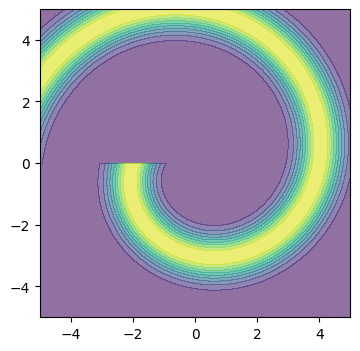

In [320]:
fig, ax = plt.subplots(figsize=(4, 4))
x, y = np.mgrid[-5:5:.01, -5:5:.01]
pos = np.dstack((x, y))
dist = target_distribution(pos)
print(dist.shape)
contour = ax.contourf(x, y, dist , levels=10, cmap='viridis', alpha=0.6)

plt.show()

In [321]:


# Save particles at each iteration for animation
all_particles = [particles.copy()]

for _ in range(num_iterations):
    particles  = svgd_update(particles, grad_log_p)
    all_particles.append(particles.copy())

# Convert to numpy array for easier handling
all_particles = np.array(all_particles)

# Create animation
fig, ax = plt.subplots(figsize=(4, 4))
x, y = np.mgrid[-5:5:.01, -5:5:.01]
pos = np.dstack((x, y))
contour = ax.contourf(x, y, target_distribution(pos), levels=10, cmap='viridis', alpha=0.6)
scatter = ax.scatter([], [], color='red', s=10)



def update(frame):
    scatter.set_offsets(all_particles[frame])
    ax.set_title(f'Iteration {frame}')
    return scatter,

ani = FuncAnimation(fig, update, frames=num_iterations, blit=True)

# Display animation
plt.close(fig)  # Close the static plot
HTML(ani.to_jshtml())

In [ ]:
ani.save('tmp.gif', writer='Pillow', fps=60)

MovieWriter imagemagick unavailable; using Pillow instead.


In [61]:
plt.rcParams.update({
    'figure.dpi': 100,
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.figsize': (6, 4),
    'lines.linewidth': 1.5,
    'grid.linestyle': '--',
    'grid.alpha': 0.7
})

# Plot with professional settings
# Choose a clean style